# Project made by:

Catarina Costa, pg52676

# CycleGAN 

## Introduction

Within the scope of the VCPI course, it was proposed to each student to explore a GAN or autoencoder model in a problem of the student's choice.

Therefore, the following project aimed to transform comic book covers into Van Gogh paintings and vice versa, using the CycleGAN model.

*CycleGAN*, or Cycle-Consistent Generative Adversarial Networks, is a modification of GAN that can be used for image-to-image translation tasks where paired training data is not available.

This work was initially developed in google colab, but due to the total expenditure of GPU resources that colab provides, the work continued its development and training process in kaggle.

That said, throughout the notebook you will notice some changes more in terms of paths that will be properly explained.

Its to mention that the idea of this project was taken from the following paper: https://junyanz.githubio/CycleGAN/.

For its realization I got help from the following source:
https://medium.com/@chilldenaya/cyclegan-introduction-pytorch-implementation-5b53913741ca

In [1]:
#!pip install torchinfo

In [59]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from PIL import Image

from torchvision.transforms import v2
import torchvision.transforms as transforms
from torchvision import datasets, transforms
from torch.utils.data import Dataset

# The Datasets

Two datasets were used, both taken from the kaggle.

1) Comic books cover images: https://www.kaggle.com/datasets/mauryansshivam/marvel?select=Comic_Character_Images2
2) Van Gogh paintings images: https://www.kaggle.com/datasets/ipythonx/van-gogh-paintings


In [95]:

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

# Van Gogh path
PATH_TRAIN_VG = '/kaggle/input/vcpi-ind/VG_Train/VG_Train'
PATH_TEST_VG = '/kaggle/input/vcpi-ind/VG_Test/VG_Test'
# Cover comics path
PATH_TRAIN_C = '/kaggle/input/vcpi-ind/CV_Train/C_Train'
PATH_TEST_C = '/kaggle/input/ahhhhhh/C_Test'

IMG_W   = 256
IMG_H =256
epoches = 100
decay_epoch = 50
display_epoch = 10

cuda:0


# Dataset Division

This section deals with the treatment splits that both datasets were subjected to before being used.

The splits were made in google colab, which is why the paths to the dataset folders are different.

## Cover dataset division

In an initial approach, the dataset of the covers was divided into 80% for training and 20% for testing. 

However, but further into development I decided to choose a set of 5 test covers that I found to be good to observe the results. 

In [ ]:
# Colab directories
C_PATH = '/content/drive/MyDrive/Mestrado/VCPI_Individual/Comics/Comic_Cover_Images'
from sklearn.model_selection import train_test_split


all_files = [os.path.join(C_PATH, name) for name in os.listdir(C_PATH)]

train_files, test_files = train_test_split(all_files, test_size=0.2, random_state=42)


print("Trainset:", train_files)
print("Testset:", test_files)

In [ ]:
import shutil
# Colab directories
PATH_TRAIN_C = '/content/drive/MyDrive/Mestrado/VCPI_Individual/Comics/C_Train'
PATH_TEST_C = '/content/drive/MyDrive/Mestrado/VCPI_Individual/Comics/C_Test'

if not os.path.exists(PATH_TRAIN_C):
    os.makedirs(PATH_TRAIN_C)
if not os.path.exists(PATH_TEST_C):
    os.makedirs(PATH_TEST_C)


for file in train_files:
    shutil.copy(file, PATH_TRAIN_C)

for file in test_files:
    shutil.copy(file, PATH_TEST_C)

## Van Gogh paintings dataset division

For the image dataset of Van Gogh's paintings, since it was divided into several folders initially, I decided to put all the images in just onde single folder. After that, as well as the covers dataset, I devided 80% of the images for training and 20% for testing.

Since the amount of training images was quite massive, I manually shorten the number of training images.

In [ ]:

VG_PATH = '/content/drive/MyDrive/Mestrado/VCPI_Individual/VG/VincentVanGogh'

import os
import shutil

def take_all_images(origin, destiny):
    
    if not os.path.exists(origin):
        os.makedirs(destiny)

   
    for root, dirs, files in os.walk(origin):
        for file in files:
            src_file = os.path.join(root, file)
            dst_file = os.path.join(destiny, file)

            if os.path.exists(dst_file):
                os.remove(dst_file)

            shutil.copy(src_file, dst_file)

origin = VG_PATH
destiny = '/content/drive/MyDrive/Mestrado/VCPI_Individual/VG/VG_All'
take_all_images(origin, destiny)

In [ ]:
from sklearn.model_selection import train_test_split
VG_PATH_ALL = '/content/drive/MyDrive/Mestrado/VCPI_Individual/VG/VG_All'
all_files = [os.path.join(VG_PATH_ALL, name) for name in os.listdir(VG_PATH_ALL)]

train_files, test_files = train_test_split(all_files, test_size=0.2, random_state=42)

print("Trainset:", train_files)
print("Testset:", test_files)

In [ ]:
PATH_TEST_VG = '/content/drive/MyDrive/Mestrado/VCPI_Individual/VG/VG_Test'

if not os.path.exists(PATH_TEST_VG):
    os.makedirs(PATH_TEST_VG)

for file in test_files:
    shutil.copy(file, PATH_TEST_VG)

# Data Loader

In this section, the data that will be used for training and testing the model is loaded.

As previously mentioned, a batch of 5 images was chosen to observe the results.

In [96]:
class getData(Dataset):
    def __init__(self, img_dir_A, img_dir_B, transform=None):
        self.img_dir_A = img_dir_A
        self.img_dir_B = img_dir_B
        self.transform = transform
        self.images_A = [os.path.join(self.img_dir_A, img) for img in os.listdir(self.img_dir_A) if img.endswith(".jpg")]
        self.images_B = [os.path.join(self.img_dir_B, img) for img in os.listdir(self.img_dir_B) if img.endswith(".jpg")]

    def __len__(self):
        return min(len(self.images_A), len(self.images_B))

    def __getitem__(self, idx):
        img_path_A = self.images_A[idx]
        img_path_B = self.images_B[idx]
        image_A = Image.open(img_path_A).convert("RGB")
        image_B = Image.open(img_path_B).convert("RGB")
        if self.transform:
            image_A = self.transform(image_A)
            image_B = self.transform(image_B)
        return image_A, image_B


transform = transforms.Compose([
    transforms.Resize((IMG_W, IMG_H)),
    transforms.ToTensor()
])

dataset_train = getData(PATH_TRAIN_C, PATH_TRAIN_VG, transform=transform)
dataset_test = getData(PATH_TEST_C, PATH_TEST_VG, transform=transform)

print(f"Dataset A (train) - {len(dataset_train)} images")
print(f"Dataset A (test) - {len(dataset_test)} images")

Dataset A (train) - 795 images
Dataset A (test) - 5 images


In [98]:
from torch.utils.data import DataLoader

batch_size = 5

# the data will be reshuffled at every epoch to garanty the model 
# doenst learn patterns based on the order of the data
trainloader = DataLoader(
    dataset_train,
    batch_size = batch_size,
    shuffle = True,
    num_workers = 2
)

# no need to shuffle the testdata
testloader = DataLoader(
    dataset_test,
    batch_size = batch_size,
    shuffle = False,
    num_workers = 2
)


# Cycle GAN 

As mentioned before, *CycleGAN* is a modification of GAN that can be used for image-to-image translation tasks where paired training data is not available.

In its arquitecture *CycleGAN* uses generator and discriminator that makes it possible for it to translate images between two unordered collections, X and Y, in both directions, meaning it can learn how to convert an image from X into Y, as ell as an image from Y into X, without any specific order.

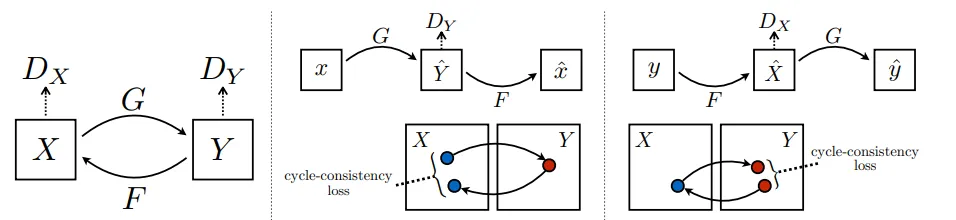

One of the goals of this project is to train CycleGAN is to create a generator G: X -> Y capable of generating images from domain (X) that closely resemble those from domain (Y), such that these synthetic images are indistinguishable from genuine ones when evaluated through an adversarial loss function. However, since this mapping can be difficult to constrain, CycleGAN also introduces an inverse mapping F: Y -> X.

In this project case, the X will be given to the Covers (G_AB) images and the Y will be given to the Van Gogh (G_BA) images.

# Generator

The generator's primary role is to create data, initially from random noise, and refine it over time to approximate the real data distribution. 

Its composed by a residual block, wich as the purpose to learn residual mapping between the input and output block.

The generator class *GeneratorResNet* will create to generators one for the cover (G_AB) and one for the paintings (G_BA).

In [99]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels, in_channels, 3),
            nn.InstanceNorm2d(in_channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels, in_channels, 3),
            nn.InstanceNorm2d(in_channels)
        )

    def forward(self, x):
        return x + self.block(x)

class GeneratorResNet(nn.Module):
    def __init__(self, in_channels, num_residual_blocks=9):
        super(GeneratorResNet, self).__init__()

        self.initial = nn.Sequential(
            nn.ReflectionPad2d(in_channels),
            nn.Conv2d(in_channels, 64, 2 * in_channels + 1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.downsample_blocks = nn.Sequential(
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.residual_blocks = nn.Sequential(*[ResidualBlock(256) for _ in range(num_residual_blocks)])

        self.upsample_blocks = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.output = nn.Sequential(
            nn.ReflectionPad2d(in_channels),
            nn.Conv2d(64, in_channels, 2 * in_channels + 1),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.initial(x)
        x = self.downsample_blocks(x)
        x = self.residual_blocks(x)
        x = self.upsample_blocks(x)
        return self.output(x)


# Discriminator

In CycleGAN the discriminator acts as a classifier, tasked with distinguishing between real data and data generated by the generator of each Domain (A nad B)

In [100]:
class Discriminator(nn.Module):
    def __init__(self, in_channels):
        super(Discriminator, self).__init__()
        self.scale_factor = 16

        self.model = nn.Sequential(
            nn.Conv2d(in_channels, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, stride=2, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ZeroPad2d((1,0,1,0)),
            nn.Conv2d(512, 1, 4, padding=1),
        )

    def forward(self, x):
        return self.model(x)

# Loss Functions

CycleGAN defines an objective function to minimize the loss.

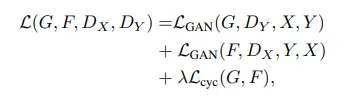

The total loss can be separated into three part, adversarial losses( for both domains X and Y) and cycle consistency loss. There is still de caculation of the identity loss.

The following functions were define to calculate the losses of the model.

*MSELoss()*: This function is responsible to calculate the squared difference between predictions and target values. It is used to to train the discriminator, favoring clear discrimination between real and generated images.

*L1Loss()*: This function is responsible to evaluate the absolute difference between predictions and target values, giving less weight to smaller errors.

In [101]:
MSE = nn.MSELoss()
cycle_loss = nn.L1Loss() # ensure cycle consistency
identity_loss = nn.L1Loss() # preserve of the identity in generated images

# Optimizer and Learning Rate

In [102]:
G_AB = GeneratorResNet(3, num_residual_blocks=9)
D_B = Discriminator(3)

G_BA = GeneratorResNet(3, num_residual_blocks=9)
D_A = Discriminator(3)

In [103]:
# Check if CUDA is available
cuda = torch.cuda.is_available()
print(f'cuda: {cuda}')

# Transfer models to CUDA if available
if cuda:
    G_AB = G_AB.cuda()
    D_B = D_B.cuda()
    G_BA = G_BA.cuda()
    D_A = D_A.cuda()

    criterion_GAN = MSE.cuda()
    criterion_cycle = cycle_loss.cuda()
    criterion_identity = identity_loss.cuda()

cuda: True


To optimize both generators and discriminators, I decided to use pytorch's Adam optimizer, since this optimizer is usually used to optimize and train CycleGAN models.

Although beta1 and beta2 values are more common (0.99 to 0.999) and (0.99 to 0.9999), I had to make adjustments as the results with these values were not as expected.

In [104]:
import torch.nn as nn
import torch.optim as optim
import itertools

optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=0.0001, betas=(0.5, 0.996))
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0001, betas=(0.5, 0.996))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0001, betas=(0.5, 0.996))

In [105]:
def learning_rate_decay(epoch, decay_start_epoch, total_epochs):
    if epoch < decay_start_epoch:
        return 1
    else:
        return 1 - (epoch - decay_start_epoch) / (total_epochs - decay_start_epoch)

lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lambda epoch: learning_rate_decay(epoch, decay_epoch, epoches))
lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(optimizer_D_A, lr_lambda=lambda epoch: learning_rate_decay(epoch, decay_epoch, epoches))
lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(optimizer_D_B, lr_lambda=lambda epoch: learning_rate_decay(epoch, decay_epoch, epoches))

# Show Test Images

In [106]:
#!pip install torchvision

Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


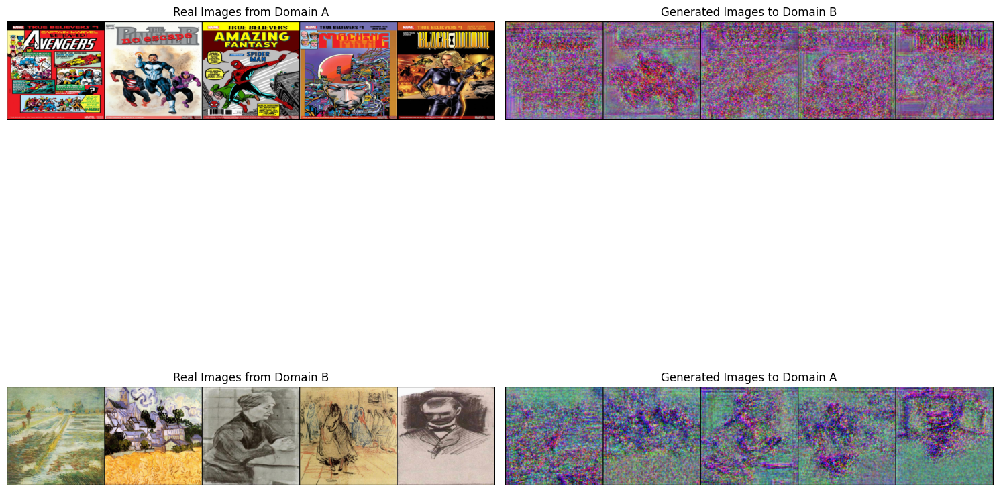

In [107]:
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor
import torchvision

from torchvision.utils import make_grid

def sample_images(real_A, real_B):    
    G_AB.eval()
    G_BA.eval()

    real_A = real_A.type(Tensor)
    fake_B = G_AB(real_A).detach()

    real_B = real_B.type(Tensor)
    fake_A = G_BA(real_B).detach()

    ncols = real_A.size(0)
    real_A_grid = make_grid(real_A, nrow=ncols, normalize=True)
    fake_B_grid = make_grid(fake_B, nrow=ncols, normalize=True)
    real_B_grid = make_grid(real_B, nrow=ncols, normalize=True)
    fake_A_grid = make_grid(fake_A, nrow=ncols, normalize=True)
    
    # Print shapes after making grids
    print("Shape of real_A grid:", real_A.size(0))
    print("Shape of fake_B grid:", fake_B.shape)
    print("Shape of real_B grid:", real_B.shape)
    print("Shape of fake_A grid:", fake_A.shape)

    fig, axs = plt.subplots(2, 2, figsize=(15, 15))  

    axs[0, 0].imshow(real_A_grid.permute(1, 2, 0).cpu())
    axs[0, 0].set_title("Real Images from Domain A")
    axs[0, 0].axis('off')

    axs[0, 1].imshow(fake_B_grid.permute(1, 2, 0).cpu())
    axs[0, 1].set_title("Generated Images to Domain B")
    axs[0, 1].axis('off')

    axs[1, 0].imshow(real_B_grid.permute(1, 2, 0).cpu())
    axs[1, 0].set_title("Real Images from Domain B")
    axs[1, 0].axis('off')

    axs[1, 1].imshow(fake_A_grid.permute(1, 2, 0).cpu())
    axs[1, 1].set_title("Generated Images to Domain A")
    axs[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

real_A, real_B = next(iter(testloader))
sample_images(real_A, real_B)

# Training

Due to the full use of kaggle resources, it was only possible to train the model up to 60 epochs. However, the model obtained very satisfactory results.

epoch 0
saved
epoch 1
saved
epoch 2
saved
epoch 3
saved
epoch 4
saved
epoch 5
saved
epoch 6
saved
epoch 7
saved
epoch 8
saved
epoch 9
saved
Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


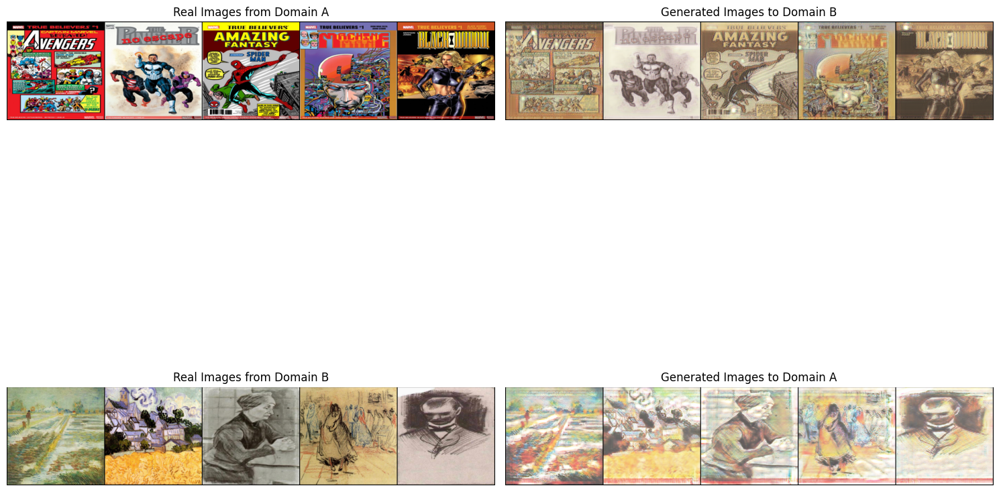

[Epoch 10 / 100]
[Generator loss: 2.1569464206695557 | identity: 0.12599675357341766 GAN: 0.5082526803016663 cycle: 0.10187098383903503]
[Discriminator loss: 0.17789050936698914 | D_A: 0.1073402687907219 D_B: 0.24844074249267578]
epoch 10
saved
epoch 11
saved
epoch 12
saved
epoch 13
saved
epoch 14
saved
epoch 15
saved
epoch 16
saved
epoch 17
saved
epoch 18
saved
epoch 19
saved
Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


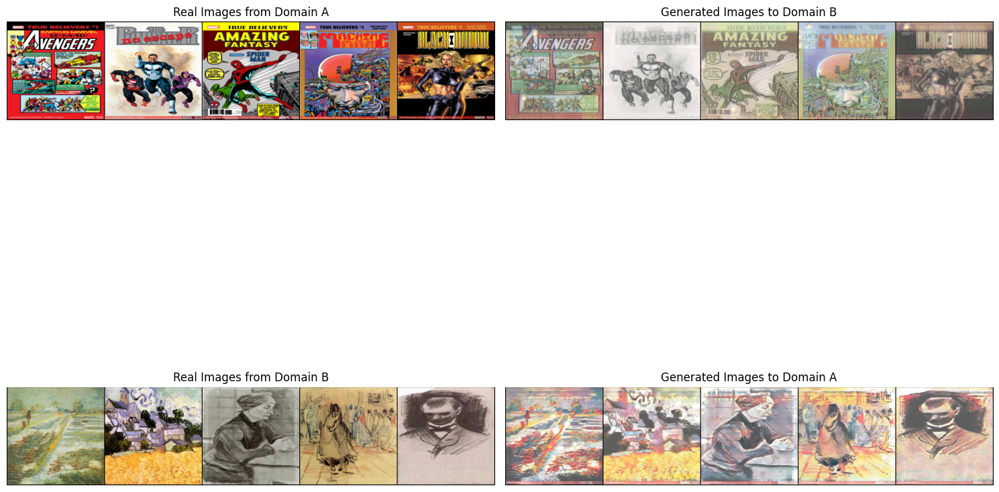

[Epoch 20 / 100]
[Generator loss: 1.8809412717819214 | identity: 0.1249837577342987 GAN: 0.5004900693893433 cycle: 0.07555323839187622]
[Discriminator loss: 0.13931779563426971 | D_A: 0.12950322031974792 D_B: 0.1491323709487915]
epoch 20
saved
epoch 21
saved
epoch 22
saved
epoch 23
saved
epoch 24
saved
epoch 25
saved
epoch 26
saved
epoch 27
saved
epoch 28
saved
epoch 29
saved
Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


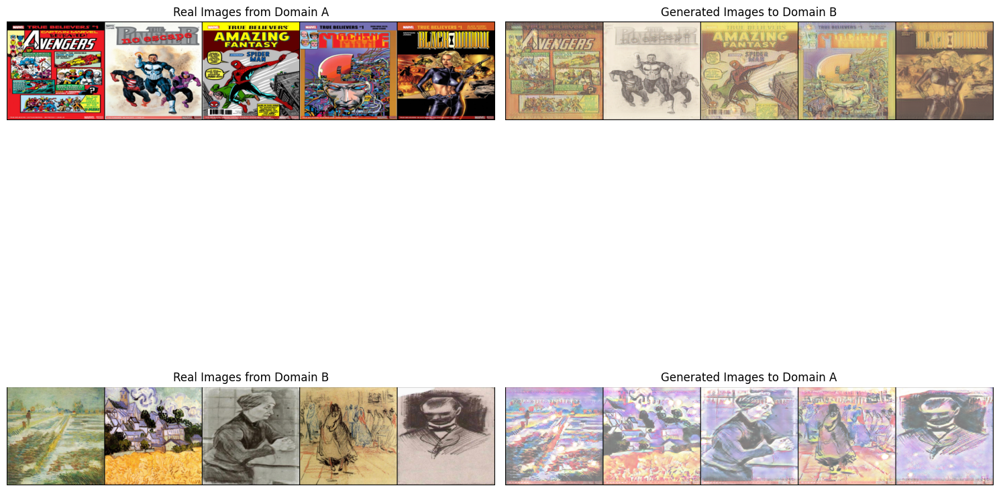

[Epoch 30 / 100]
[Generator loss: 2.279233932495117 | identity: 0.14187248051166534 GAN: 0.6700578927993774 cycle: 0.08998136222362518]
[Discriminator loss: 0.10222461819648743 | D_A: 0.08958053588867188 D_B: 0.11486870050430298]
epoch 30
saved
epoch 31
saved
epoch 32
saved
epoch 33
saved
epoch 34
saved
epoch 35
saved
epoch 36
saved
epoch 37
saved
epoch 38
saved
epoch 39
saved
Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


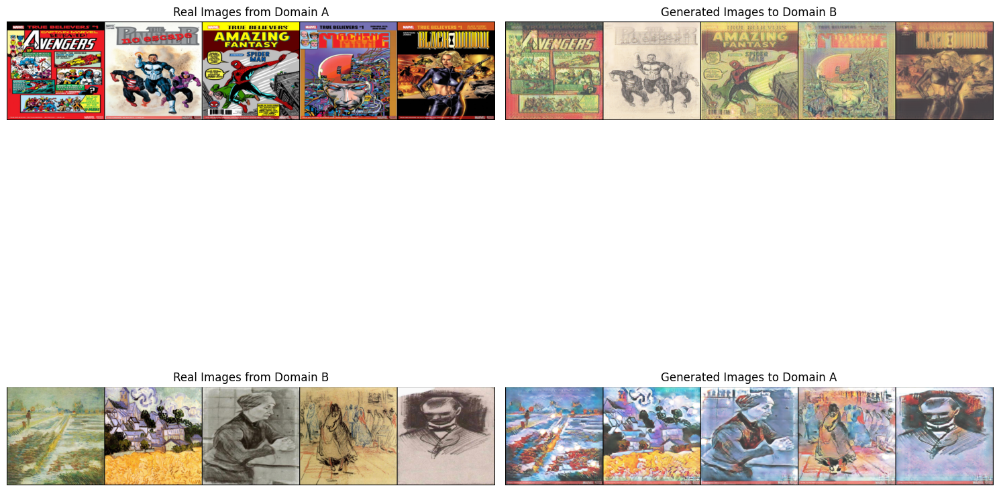

[Epoch 40 / 100]
[Generator loss: 1.9265005588531494 | identity: 0.11534248292446136 GAN: 0.6046215295791626 cycle: 0.0745166540145874]
[Discriminator loss: 0.15835344791412354 | D_A: 0.10912660509347916 D_B: 0.2075802981853485]
epoch 40
saved
epoch 41
saved
epoch 42
saved
epoch 43
saved
epoch 44
saved
epoch 45
saved
epoch 46
saved
epoch 47
saved
epoch 48
saved
epoch 49
saved
Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


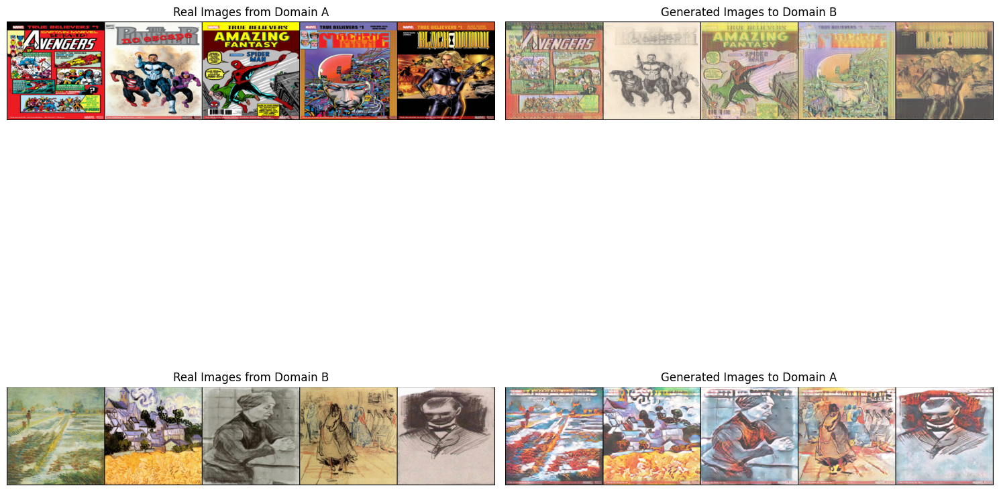

[Epoch 50 / 100]
[Generator loss: 1.8936309814453125 | identity: 0.12288124859333038 GAN: 0.6027736663818359 cycle: 0.0676451101899147]
[Discriminator loss: 0.09672276675701141 | D_A: 0.0873810350894928 D_B: 0.10606450587511063]
epoch 50
saved
epoch 51
saved
epoch 52
saved
epoch 53
saved
epoch 54
saved
epoch 55
saved
epoch 56
saved
epoch 57
saved
epoch 58
saved
epoch 59
saved
Shape of real_A grid: 5
Shape of fake_B grid: torch.Size([5, 3, 256, 256])
Shape of real_B grid: torch.Size([5, 3, 256, 256])
Shape of fake_A grid: torch.Size([5, 3, 256, 256])


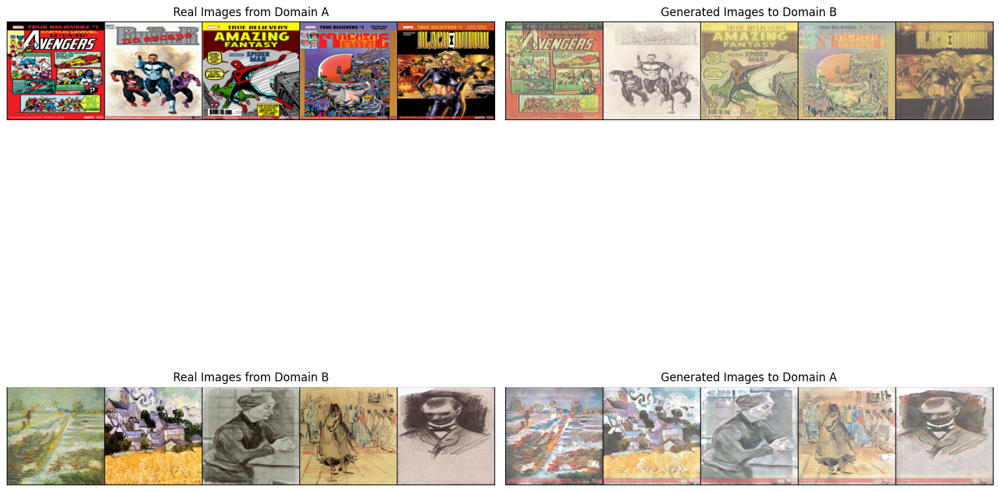

[Epoch 60 / 100]
[Generator loss: 1.7643744945526123 | identity: 0.11159253120422363 GAN: 0.5828475952148438 cycle: 0.06235641986131668]
[Discriminator loss: 0.13429762423038483 | D_A: 0.08347899466753006 D_B: 0.1851162612438202]
epoch 60


In [ ]:
for epoch in range(epoches):
    print('epoch', epoch)
    for i, (real_A, real_B) in enumerate(trainloader):
        real_A, real_B = real_A.type(Tensor), real_B.type(Tensor)
        out_shape = [real_A.size(0), 1, real_A.size(2) // D_A.scale_factor, real_A.size(3) // D_A.scale_factor]
        
        valid = torch.ones(out_shape).type(Tensor)
        fake = torch.zeros(out_shape).type(Tensor)
        
        # training generators
        G_AB.train()
        G_BA.train()
        
        optimizer_G.zero_grad()
        
        fake_B = G_AB(real_A)
        fake_A = G_BA(real_B)
        
        # identity loss
        loss_id_A = identity_loss(fake_B, real_A)
        loss_id_B = identity_loss(fake_A, real_B)
        loss_identity = (loss_id_A + loss_id_B) / 2
        
        #adversial loss
        # gan loss
        loss_GAN_AB = MSE(D_B(fake_B), valid) 
        loss_GAN_BA = MSE(D_A(fake_A), valid)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2
        
        # cycle loss
        recov_A = G_BA(fake_B)
        recov_B = G_AB(fake_A)
        
        loss_cycle_A = cycle_loss(recov_A, real_A)
        loss_cycle_B = cycle_loss(recov_B, real_B)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2
        
        # total gan loss
        loss_G = 5.0 * loss_identity + loss_GAN + 10.0 * loss_cycle
        
        loss_G.backward()
        optimizer_G.step()
        
        #training discriminator A
        optimizer_D_A.zero_grad()
        
        loss_real = MSE(D_A(real_A), valid)
        loss_fake = MSE(D_A(fake_A.detach()), fake)
        loss_D_A = (loss_real + loss_fake) / 2
        
        loss_D_A.backward()
        optimizer_D_A.step()
        
        #training discriminator B
        optimizer_D_B.zero_grad()
        
        loss_real = MSE(D_B(real_B), valid)
        loss_fake = MSE(D_B(fake_B.detach()), fake)
        loss_D_B = (loss_real + loss_fake) / 2
        
        loss_D_B.backward()
        optimizer_D_B.step()
    
    lr_scheduler_G.step()
    lr_scheduler_D_A.step()
    lr_scheduler_D_B.step()
    
    # Save GA
    torch.save({
        'model_state_dict': G_AB.state_dict(),
        'optimizer_state_dict': optimizer_G.state_dict(),
        'epoch': epoch,
    }, f'GeneratoAB_model_epochTG.pth')

    torch.save({
        'model_state_dict': G_BA.state_dict(),
        'optimizer_state_dict': optimizer_G.state_dict(),
        'epoch': epoch,
    }, f'GeneratorBA_model_epochTG.pth')

    # save DA
    torch.save({
        'model_state_dict': D_A.state_dict(),
        'optimizer_state_dict': optimizer_D_A.state_dict(),
        'epoch': epoch,
    }, f'Discriminator_A_model_epochTG.pth')

    # save DB
    torch.save({
        'model_state_dict': D_B.state_dict(),
        'optimizer_state_dict': optimizer_D_B.state_dict(),
        'epoch': epoch,
    }, f'Discriminator_B_model_epochTG.pth')
    
    print('saved')
    
    # display results every 10 epoch
    if (epoch + 1) % display_epoch == 0:
        test_real_A, test_real_B = next(iter(testloader))
        sample_images(test_real_A, test_real_B)

        loss_D = (loss_D_A + loss_D_B) / 2
        print(f'[Epoch {epoch + 1} / {epoches}]')
        print(f'[Generator loss: {loss_G.item()} | identity: {loss_identity.item()} GAN: {loss_GAN.item()} cycle: {loss_cycle.item()}]')
        print(f'[Discriminator loss: {loss_D.item()} | D_A: {loss_D_A.item()} D_B: {loss_D_B.item()}]')    

# Conclusion

We can see that the 'Generated Images to domain A' has better results then the 'Generated Images to domain B'. A way to improve more the quality of the images is to lower the learning rate or higher up the lambda.

## Losses

In terms of losses the final results were good, but cloud be better. 

On the 60th epoch it showed us a Generator loss of 1.76, that give us the feedback that the generator is working well.

We notice that the Discriminator loss is also low (13%) wich says that the most of images that the generators are making, the discriminators can identify between the real ones and the fake ones. 

The identity losses were low so the Generator is preserving well the caracteristics of the original imagens.

As for the GAN losses it reveals that the Generator is having difficulties in fooling the Discriminator. 

# Other tests

Priviously to this one I tried to run a diferent version of the CycleGan to other dataset, these were the obtained results.

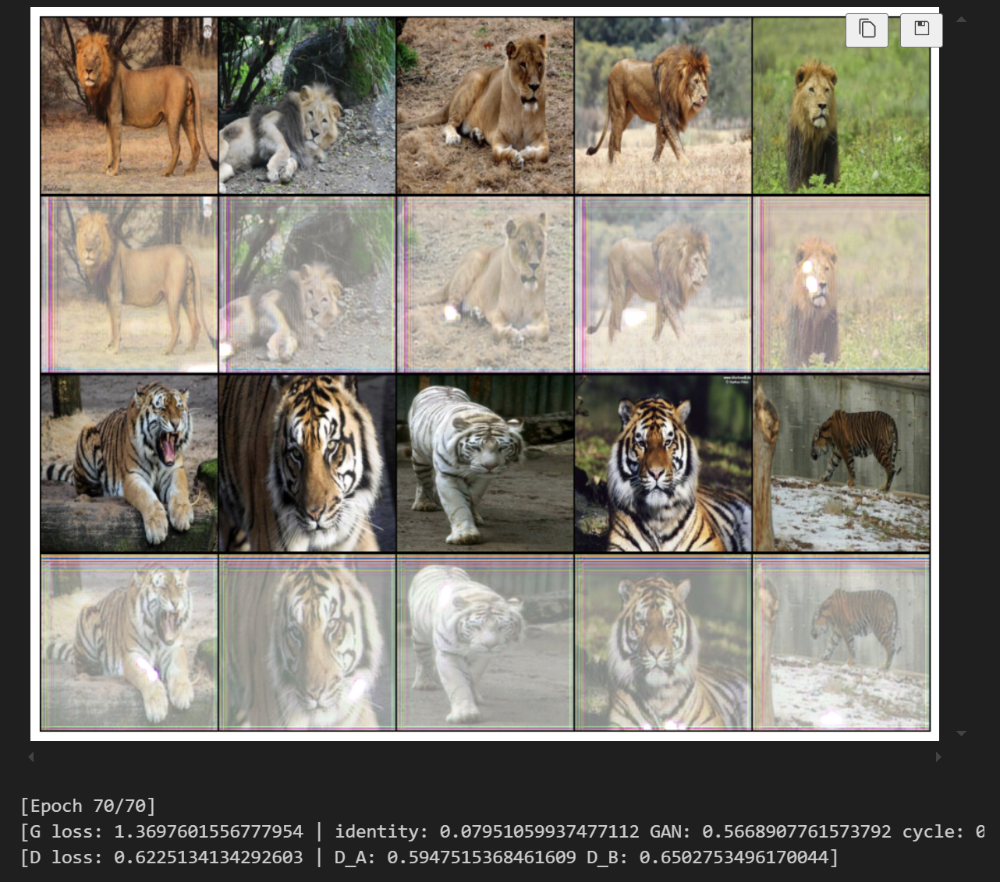

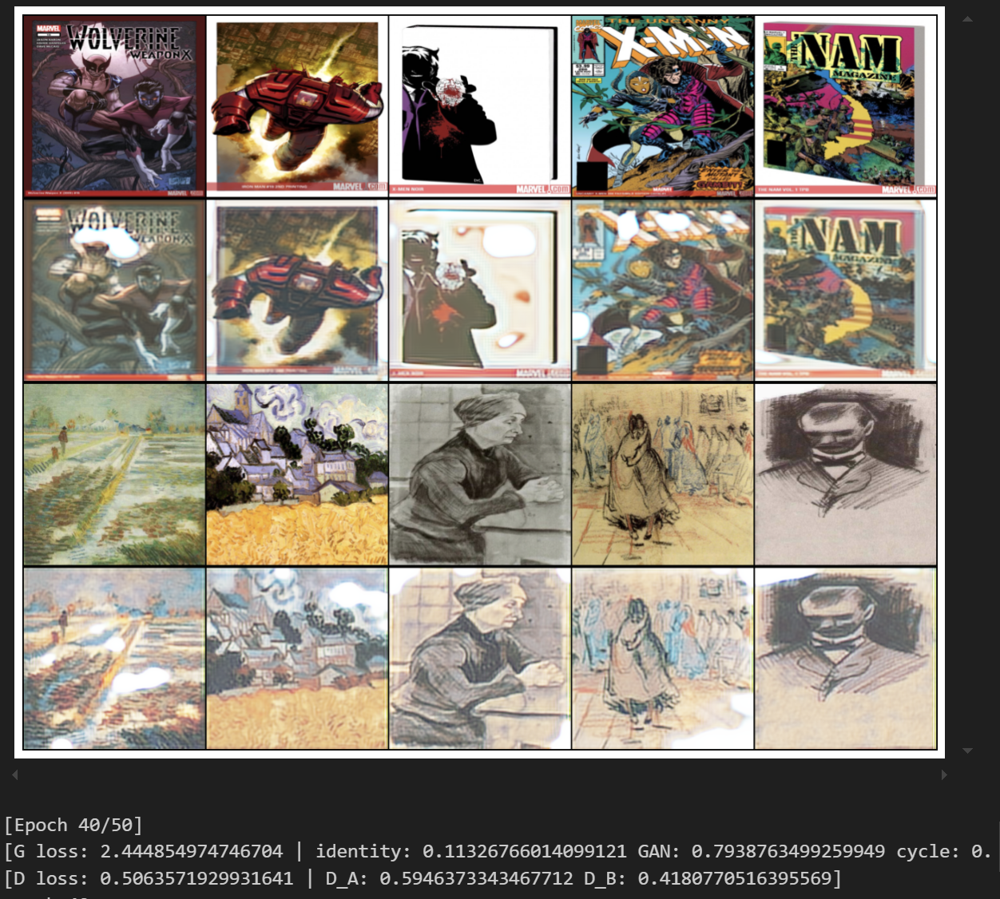